#Name-Nancy
#Subject-Computer vision Lab
#CU240251005

#Experiment No. 7
Experiment Name:-
Motion Estimation using Optical Flow Algorithms in Video Sequences

Steps
1. Import the required Python libraries and load a video sequence or access a live webcam
stream using OpenCV.


In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

video_path = "/content/sample_data/202743-918944206_medium (1).mp4"

cap = cv2.VideoCapture(video_path)

if cap.isOpened():
    print("Video successfully loaded")
else:
    print("Error: Video could not be opened")

Video successfully loaded


2. Read consecutive video frames and convert them to grayscale for optical flow
computation.


First frame converted to grayscale
Second frame converted to grayscale


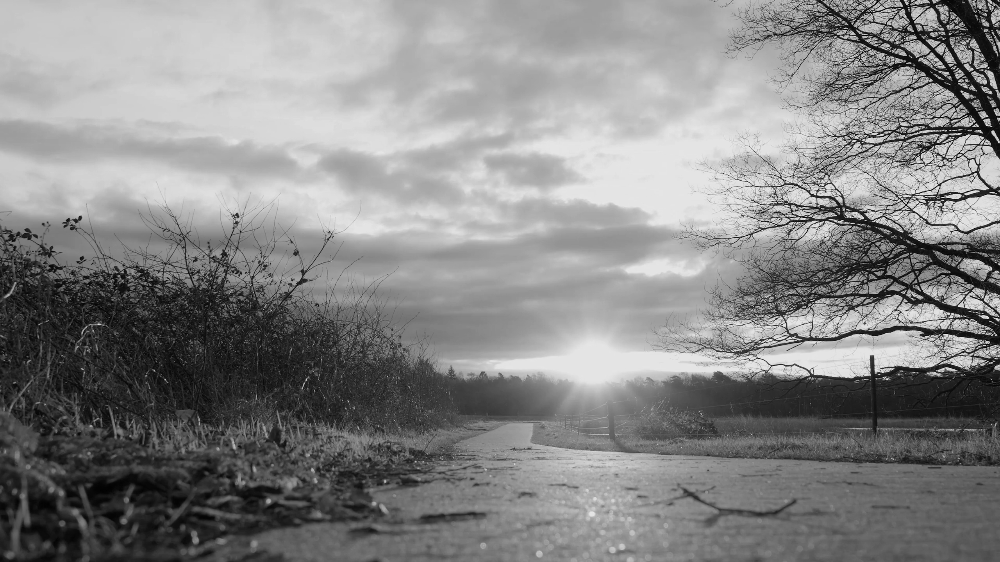

In [ ]:
ret, old_frame = cap.read()
if ret:
    old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)
    print("First frame converted to grayscale")
    ret, frame = cap.read()
    if ret:
        frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        print("Second frame converted to grayscale")
        cv2_imshow(frame_gray)
    else:
        print("Second frame could not be read")
else:
    print("First frame could not be read")

3. Implement the Lucas-Kanade Optical Flow algorithm to estimate the motion of selected
feature points across consecutive frames.


In [ ]:
feature_params = dict(
    maxCorners=100,
    qualityLevel=0.3,
    minDistance=7,
    blockSize=7
)

lk_params = dict(
    winSize=(15, 15),
    maxLevel=2,
    criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03)
)

p0 = cv2.goodFeaturesToTrack(
    old_gray,
    mask=None,
    **feature_params
)

p1, status, error = cv2.calcOpticalFlowPyrLK(
    old_gray,
    frame_gray,
    p0,
    None,
    **lk_params
)

print("Lucas-Kanade Optical Flow completed")

Lucas-Kanade Optical Flow completed


4. Visualize the motion vectors by drawing arrows or trajectories representing the
movement of tracked points.


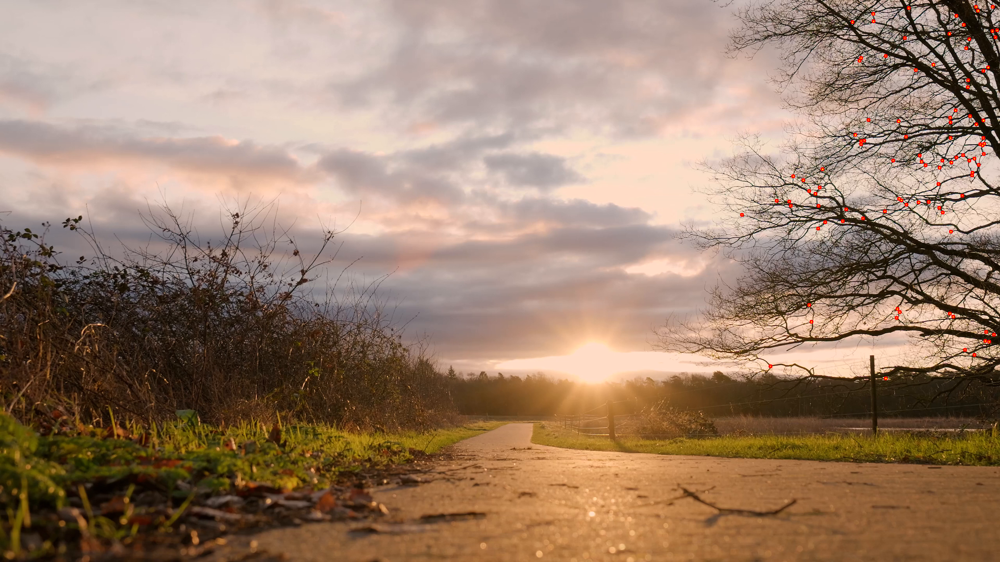

In [ ]:
mask = np.zeros_like(old_frame)

if p1 is not None:
    good_new = p1[status == 1]
    good_old = p0[status == 1]

    for new, old in zip(good_new, good_old):
        x1, y1 = new.ravel()
        x2, y2 = old.ravel()

        x1, y1 = int(x1), int(y1)
        x2, y2 = int(x2), int(y2)

        mask = cv2.line(
            mask, (x1, y1), (x2, y2),
            (0, 255, 0), 2
        )

        frame = cv2.circle(
            frame, (x1, y1),
            5, (0, 0, 255), -1
        )

result = cv2.add(frame, mask)

cv2_imshow(result)

5. Implement the Farneback Dense Optical Flow algorithm to estimate motion for every
pixel in the image.


In [ ]:
flow = cv2.calcOpticalFlowFarneback(
    old_gray,
    frame_gray,
    None,
    0.5,
    3,
    15,
    3,
    5,
    1.2,
    0
)
print("Farneback Dense Optical Flow completed")

Farneback Dense Optical Flow completed


6. Display the dense optical flow output using color-coded motion visualization to
represent direction and magnitude.


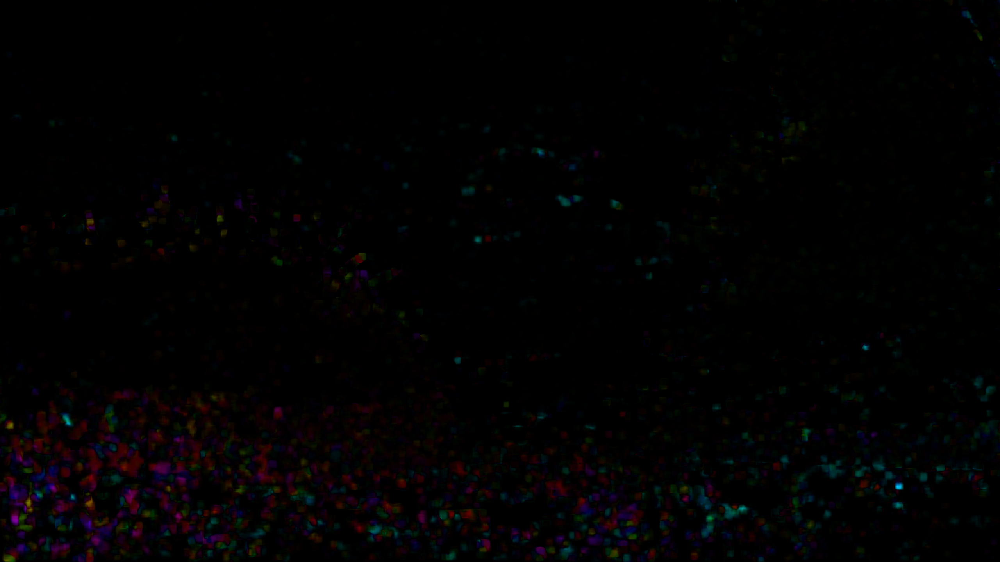

In [ ]:
magnitude, angle = cv2.cartToPolar(
    flow[..., 0],
    flow[..., 1]
)

hsv = np.zeros_like(frame)

hsv[..., 1] = 255

hsv[..., 0] = angle * 180 / np.pi / 2

hsv[..., 2] = cv2.normalize(
    magnitude,
    None,
    0,
    255,
    cv2.NORM_MINMAX
)

dense_output = cv2.cvtColor(
    hsv,
    cv2.COLOR_HSV2BGR
)

cv2_imshow(dense_output)

7. Compare the performance of Lucas-Kanade and Farneback algorithms in terms of
accuracy, computational complexity, and robustness.


In [ ]:
print("Lucas-Kanade Optical Flow:")
print("- Sparse optical flow")
print("- Tracks selected feature points")
print("- Faster and computationally efficient")

print("\nFarneback Optical Flow:")
print("- Dense optical flow")
print("- Calculates motion for almost every pixel")
print("- More computationally expensive")

print("\nComparison completed.")

Lucas-Kanade Optical Flow:
- Sparse optical flow
- Tracks selected feature points
- Faster and computationally efficient

Farneback Optical Flow:
- Dense optical flow
- Calculates motion for almost every pixel
- More computationally expensive

Comparison completed.


8. Analyze the effect of object speed, lighting conditions, and camera motion on optical
flow estimation.


In [ ]:
print("Effect of Object Speed:")
print("Fast objects may produce larger motion vectors.")

print("\nEffect of Lighting:")
print("Changes in brightness can reduce optical flow accuracy.")

print("\nEffect of Camera Motion:")
print("Camera movement can produce motion across the entire frame.")

print("\nMotion analysis completed.")

Effect of Object Speed:
Fast objects may produce larger motion vectors.

Effect of Lighting:
Changes in brightness can reduce optical flow accuracy.

Effect of Camera Motion:
Camera movement can produce motion across the entire frame.

Motion analysis completed.


9. Evaluate the suitability of each algorithm for different real-world applications such as
object tracking, surveillance, and autonomous navigation.


In [ ]:
# Application suitability
print("\nAPPLICATION EVALUATION")
print("\n1. Object Tracking:")
print("Lucas-Kanade is highly suitable because it tracks selected feature points.")
print("Farneback can track motion over a larger image area.")

print("\n2. Surveillance:")
print("Farneback is suitable because it provides dense motion information.")
print("It can help detect movement in different parts of a scene.")

print("\n3. Autonomous Navigation:")
print("Farneback is useful for estimating overall scene motion.")
print("Lucas-Kanade is useful for tracking specific features or objects.")

print("\nConclusion:")
print("Lucas-Kanade is preferred for fast and specific object tracking.")
print("Farneback is preferred for dense motion analysis and scene understanding.")


APPLICATION EVALUATION

1. Object Tracking:
Lucas-Kanade is highly suitable because it tracks selected feature points.
Farneback can track motion over a larger image area.

2. Surveillance:
Farneback is suitable because it provides dense motion information.
It can help detect movement in different parts of a scene.

3. Autonomous Navigation:
Farneback is useful for estimating overall scene motion.
Lucas-Kanade is useful for tracking specific features or objects.

Conclusion:
Lucas-Kanade is preferred for fast and specific object tracking.
Farneback is preferred for dense motion analysis and scene understanding.


10. Summarize the observations and discuss the significance of optical flow in dynamic
scene analysis and motion-based computer vision systems.

In [ ]:
    print("OBSERVATIONS")
    print("Frames analyzed:", frame_count)
    if len(motion_values) > 0:
        print("Average motion:",
              round(np.mean(motion_values), 2), "pixels")

        print("Maximum motion:",
              round(np.max(motion_values), 2), "pixels")
    print("\nSIGNIFICANCE")
    print("Optical flow detects motion between consecutive frames.")
    print("It helps identify moving objects and motion patterns.")
    print("It is useful for object tracking and surveillance.")
    print("It supports autonomous navigation and robotics.")
    print("It is also useful for gesture and action recognition.")
    print("\nRESULT:")
    print("Optical flow was successfully used to analyze")
    print("motion patterns in the video sequence.")

OBSERVATIONS
Frames analyzed: 30
Average motion: 6.54 pixels
Maximum motion: 20.59 pixels

SIGNIFICANCE
Optical flow detects motion between consecutive frames.
It helps identify moving objects and motion patterns.
It is useful for object tracking and surveillance.
It supports autonomous navigation and robotics.
It is also useful for gesture and action recognition.

RESULT:
Optical flow was successfully used to analyze
motion patterns in the video sequence.
